In [42]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [43]:
# La función get_error_metrics(...) calcula métricas de error (RMSE, MAPE y RMSPE) entre predicciones y valores reales,
#  y retorna un DataFrame con los resultados etiquetados según el modelo y la técnica utilizados.
def get_error_metrics(y_pred, y_test, model):

    # Calcular métricas de error
    residuals = y_test.values - y_pred.values
    rmse = np.sqrt(np.mean(residuals**2))
    mape = np.mean(np.abs(residuals / y_test.values)) 
    rmspe = np.sqrt(np.mean((residuals / y_test.values) ** 2))

    # Crear un registro con los resultados del modelo
    nuevo_resultado = {
        "Model" : [f"{model}"],
        "RMSPE": rmspe,
        "RMSE": rmse,
        "MAPE": mape
    }

    return pd.DataFrame(nuevo_resultado)

In [44]:
c_test = "#3CA6A6"
c_sarima = "#0F4A6E"
c_om = "#FF922C"
c_gm = "#F56F57"
c_lstm = "#864CA1"

In [45]:
color_palette = {
    'SARIMA': c_sarima,
    'LightGBM One-Model': c_om,
    "LightGBM Global-Model":c_gm,
    "LSTM":c_lstm
}

In [46]:
arima = pd.read_csv("forecast_sarima.csv", parse_dates=["Fecha"]).rename(columns={"Test": "M3 Ap", 'id':'id_combinacion'})
lgbm_om = pd.read_csv("resultados_lgbm_om.csv", parse_dates=["Fecha"]).rename(columns={"y_pred": "LightGBM One-Model"})
lgbm_mg = pd.read_csv("predictions_lgbm_mg.csv", parse_dates=["Fecha"]).rename(columns={"y_pred": "LightGBM Global-Model"})
lstm = pd.read_csv("lstm_prediction.csv", parse_dates=["Fecha"]).rename(columns={"y_pred": "LSTM"})

In [47]:
df = pd.merge(left= arima, right= lgbm_om, on=["Fecha", "id_combinacion", "M3 Ap"], how="left")
df = df.merge(right=lgbm_mg, on=["Fecha", "id_combinacion", "M3 Ap","Grupo Cliente"], how="left")
df = df.merge(right=lstm, on=["Fecha", "id_combinacion", "M3 Ap", "Grupo Cliente"], how="left")


In [48]:
df_grupo = df.groupby(by=["Fecha","Grupo Cliente"], as_index=False)[['M3 Ap', 'SARIMA', 'LightGBM One-Model','LightGBM Global-Model','LSTM']].sum()
df_grupo

,Fecha,Grupo Cliente,M3 Ap,SARIMA,LightGBM One-Model,LightGBM Global-Model,LSTM
0,2020-01-01,No Residencial,246510.28,245801.787061,241799.721638,238513.426736,232465.5720
1,2020-01-01,Residencial,722825.93,731535.715700,721959.187745,726008.821538,677672.9000
2,2020-02-01,No Residencial,239509.69,245903.529848,239153.150044,243971.563854,218369.3650
3,2020-02-01,Residencial,716064.73,720606.792384,723813.940179,721327.634351,682202.8000
4,2020-03-01,No Residencial,239041.69,243122.708844,243856.424040,247272.260063,234196.7043
...,...,...,...,...,...,...,...
115,2024-10-01,Residencial,637124.65,680017.944542,661638.270872,800831.845461,754327.0600
116,2024-11-01,No Residencial,221132.37,210819.500144,224460.723710,223066.704382,232187.7725
117,2024-11-01,Residencial,705987.99,705013.470323,696350.594633,844983.322326,788591.4400
118,2024-12-01,No Residencial,241780.06,219890.886141,243934.521654,230847.832054,237246.3130


## Residencial

Text(0.5, 0.98, 'BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL')

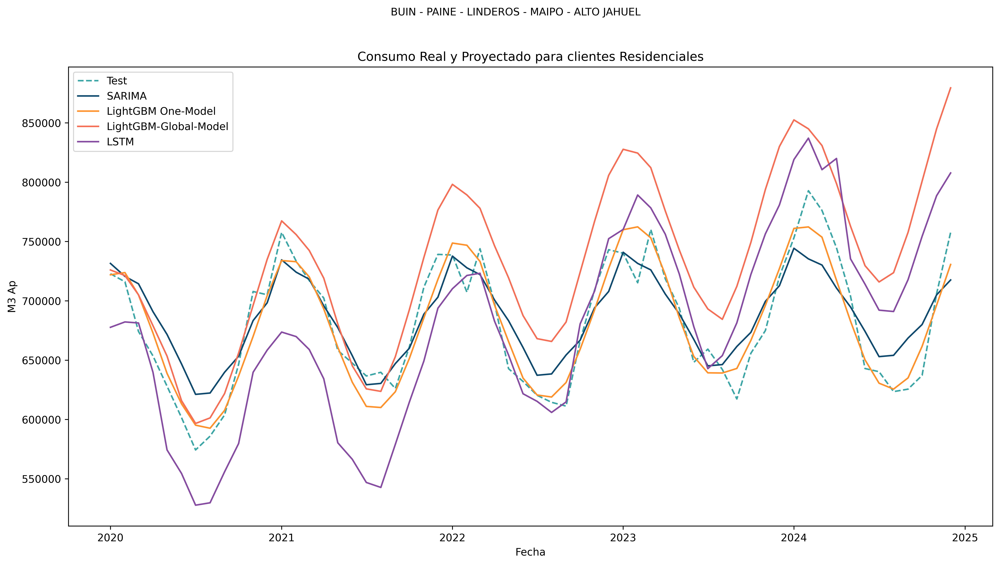

In [49]:
df_res = df_grupo[df_grupo["Grupo Cliente"] == "Residencial"]

plt.figure(figsize=(16,8), dpi=600)

sns.lineplot(df_res, x= "Fecha", y="M3 Ap", color= c_test, linestyle="--", label = 'Test')
sns.lineplot(df_res, x= "Fecha", y="SARIMA", color= c_sarima, label = 'SARIMA')
sns.lineplot(df_res, x= "Fecha", y="LightGBM One-Model", color= c_om, label = 'LightGBM One-Model')
sns.lineplot(df_res, x= "Fecha", y="LightGBM Global-Model", color= c_gm, label = 'LightGBM-Global-Model')
sns.lineplot(df_res, x= "Fecha", y="LSTM", color= c_lstm, label = 'LSTM')

plt.title("Consumo Real y Proyectado para clientes Residenciales", fontsize=12)
plt.suptitle("BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL", fontsize=10)

In [50]:
df_melt = df_res.melt(id_vars=["Fecha", "Grupo Cliente"], var_name="Metodo", value_name="Prediccion")

df_test = df_melt[df_melt["Metodo"] == "M3 Ap"]
df_val = df_melt[df_melt["Metodo"] != "M3 Ap"]

In [51]:
g = sns.relplot(
    data=df_val,
    x="Fecha", y="Prediccion", col="Metodo", hue="Metodo",
    kind="line", col_wrap=2, height=5, aspect=1.5, zorder=4, palette=color_palette
)

for met, ax in g.axes_dict.items():
        # Add the title as an annotation within the plot
    ax.text(x=.5, y=.95, s=met, transform=ax.transAxes, fontweight="bold", ha="center")
    sns.lineplot(
        data=df_val, x="Fecha", y="Prediccion", units="Metodo", estimator=None,
        ax=ax, color='.7', linewidth=1
    )
    sns.lineplot(data=df_test, x= "Fecha", y="Prediccion", color= c_test,label= "Test" if met=="SARIMA" else None ,linestyle="--", ax=ax)

# Reduce the frequency of the x axis ticks
# ax.set_xticks(ax.get_xticks()[::2])
# Remove the legend
g._legend.remove()
# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "M3")
g.tight_layout()
g.figure.set_dpi(600)

In [52]:
tabla = pd.DataFrame()

for met in df_val["Metodo"].unique():
    tabla = pd.concat(
        [
            tabla,
            get_error_metrics(df_test["Prediccion"], df_val[df_val["Metodo"] == met]["Prediccion"],met)
        ]
    )
tabla

,Model,RMSPE,RMSE,MAPE
0,SARIMA,0.039270,26721.391847,0.031981
0,LightGBM One-Model,0.026062,18011.257390,0.020951
0,LightGBM Global-Model,0.084462,65402.744222,0.070703
0,LSTM,0.082189,54146.517235,0.069774


## No Residencial

Text(0.5, 0.98, 'BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL')

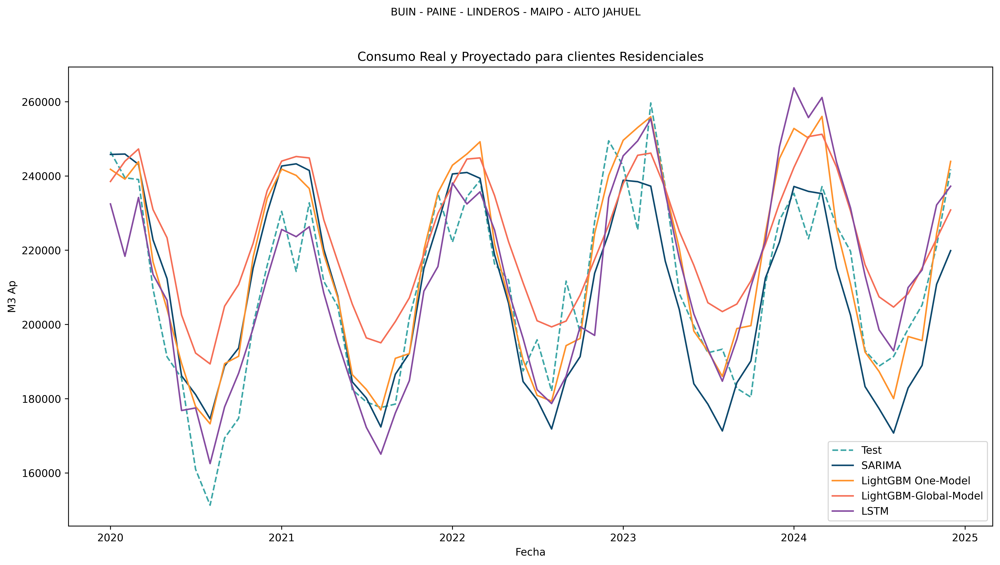

In [53]:
df_nores = df_grupo[df_grupo["Grupo Cliente"] == "No Residencial"]

plt.figure(figsize=(16,8), dpi=600)

sns.lineplot(df_nores, x= "Fecha", y="M3 Ap", color= c_test, linestyle="--", label = 'Test')
sns.lineplot(df_nores, x= "Fecha", y="SARIMA", color= c_sarima, label = 'SARIMA')
sns.lineplot(df_nores, x= "Fecha", y="LightGBM One-Model", color= c_om, label = 'LightGBM One-Model')
sns.lineplot(df_nores, x= "Fecha", y="LightGBM Global-Model", color= c_gm, label = 'LightGBM-Global-Model')
sns.lineplot(df_nores, x= "Fecha", y="LSTM", color= c_lstm, label = 'LSTM')

plt.title("Consumo Real y Proyectado para clientes Residenciales", fontsize=12)
plt.suptitle("BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL", fontsize=10)

In [54]:
df_melt = df_nores.melt(id_vars=["Fecha", "Grupo Cliente"], var_name="Metodo", value_name="Prediccion")

df_test = df_melt[df_melt["Metodo"] == "M3 Ap"]
df_val = df_melt[df_melt["Metodo"] != "M3 Ap"]

In [55]:
g = sns.relplot(
    data=df_val,
    x="Fecha", y="Prediccion", col="Metodo", hue="Metodo",
    kind="line", col_wrap=2, height=5, aspect=1.5, zorder=4, palette=color_palette
)

for met, ax in g.axes_dict.items():
        # Add the title as an annotation within the plot
    ax.text(x=.5, y=.95, s=met, transform=ax.transAxes, fontweight="bold", ha="center")
    sns.lineplot(
        data=df_val, x="Fecha", y="Prediccion", units="Metodo", estimator=None,
        ax=ax, color='.7', linewidth=1
    )
    sns.lineplot(data=df_test, x= "Fecha", y="Prediccion", color= c_test,label= "Test" if met=="SARIMA" else None ,linestyle="--", ax=ax)

# Reduce the frequency of the x axis ticks
# ax.set_xticks(ax.get_xticks()[::2])
# Remove the legend
g._legend.remove()
# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("", "M3")
g.tight_layout()
g.figure.set_dpi(600)

In [56]:
tabla = pd.DataFrame()

for met in df_val["Metodo"].unique():
    tabla = pd.concat(
        [
            tabla,
            get_error_metrics(df_test["Prediccion"], df_val[df_val["Metodo"] == met]["Prediccion"],met)
        ]
    )
tabla

,Model,RMSPE,RMSE,MAPE
0,SARIMA,0.067485,13571.957282,0.055371
0,LightGBM One-Model,0.055957,12072.499754,0.043744
0,LightGBM Global-Model,0.084115,18056.980689,0.071871
0,LSTM,0.064004,13786.513222,0.052006


## Futuro

In [62]:
future = pd.read_csv("Forecasters/proyeccion_lgbm_om.csv", parse_dates=["Fecha"]).rename(columns={"y_pred": "LightGBM One-Model"})
future["Grupo Cliente"] = future["id_combinacion"].apply(lambda x: "Residencial" if 'Residencial' in x else "No Residencial")
future

,id_combinacion,Fecha,LightGBM One-Model,Grupo Cliente
0,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2025-01-01,179599.356834,No Residencial
1,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2025-02-01,182522.843829,No Residencial
2,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2025-03-01,190138.317443,No Residencial
3,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2025-04-01,177097.915301,No Residencial
4,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2025-05-01,163751.406578,No Residencial
...,...,...,...,...
295,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2029-08-01,22678.393877,No Residencial
296,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2029-09-01,21142.165045,No Residencial
297,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2029-10-01,22831.538371,No Residencial
298,BUIN - PAINE - LINDEROS - MAIPO - ALTO JAHUEL;...,2029-11-01,24533.711057,No Residencial


In [67]:
df_future = pd.concat([df[["id_combinacion","Fecha","LightGBM One-Model", "Grupo Cliente"]], future], axis=0)
df_future.to_csv('Forecasters/lgbm_2020_2023.csv', index=False)
df_future = df_future.groupby(by=["Fecha","Grupo Cliente"], as_index=False)[["LightGBM One-Model"]].sum().set_index("Fecha")
df_future

,Grupo Cliente,LightGBM One-Model
Fecha,,
2020-01-01,No Residencial,241799.721638
2020-01-01,Residencial,721959.187745
2020-02-01,No Residencial,239153.150044
2020-02-01,Residencial,723813.940179
2020-03-01,No Residencial,243856.424040
...,...,...
2029-10-01,Residencial,756815.840607
2029-11-01,No Residencial,284703.286683
2029-11-01,Residencial,795418.539987


Text(0.5, 1.0, 'No Residencial')

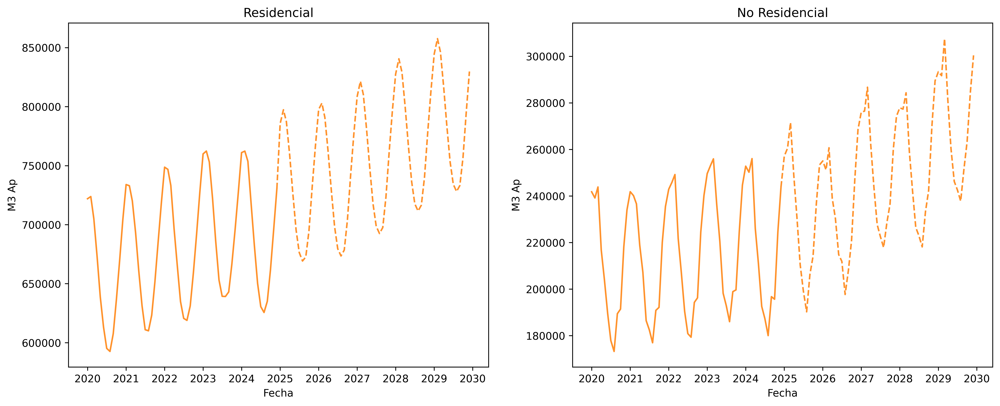

In [77]:
fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(16,6), dpi = 600)

data_res = df_future[df_future["Grupo Cliente"] == "Residencial"]
sns.lineplot(data=data_res.loc[:'2024-12-01',:], x="Fecha", y="LightGBM One-Model", color=c_om, ax=ax[0])
sns.lineplot(data=data_res.loc['2024-12-01':,:], x="Fecha", y="LightGBM One-Model", color=c_om, ax=ax[0], linestyle="--")
ax[0].set_ylabel("M3 Ap")
ax[0].set_title("Residencial")

data_nores = df_future[df_future["Grupo Cliente"] == "No Residencial"]
sns.lineplot(data=data_nores.loc[:'2024-12-01',:], x="Fecha", y="LightGBM One-Model", color=c_om, ax=ax[1])
sns.lineplot(data=data_nores.loc['2024-12-01':,:], x="Fecha", y="LightGBM One-Model", color=c_om, ax=ax[1], linestyle="--")
ax[1].set_ylabel("M3 Ap")
ax[1].set_title("No Residencial")
